<a href="https://colab.research.google.com/github/MarkoArsenovic/PPPO2021/blob/main/Vezbe01.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Vežbe 01** Manipulacija i transformacija fotografija

## Sadržaj

1.   Uvod
2.   Transformacija prostora boja: RGB u Lab prostor boja
3.   Afina transformacija
4.   Projekcija perspektive i homografija
5.   Skice sa fotografije
6.   Ilustrovanje fotografije / Crtane fotografije
7.   Skice olovke, skice olovke u boji i slike u stilizovanim bojama sa opencv-python bibliotekom
8.   Pointilizam / Divizionizam
9.   Simuliranje svetlosne umetnosti / duga ekspozicija
10.  Proširena dubina polja sa mahotas-python bibliotekom
11.  Detekcija boja pomoću opencv-python biblioteke



### Uvod

*Image Processing* predstavlja obradu fotografija, čiji je fokus na razvoj računarskog sistema koji je u stanju da izvrši obradu fotografija. Ulaz tog sistema je digitalna fotografija. Sistem obrađuje tu fotografiju koristeći efikasne algoritme i daje novu fotografiju kao izlaz.

Obrada fotografija obuhvata manipulaciju i transformaciju, koje se koriste kako bi se poboljšao izgled same fotografije. Operacije transformacije i manipulacije takođe se mogu koristiti kao koraci pred-obrade za složenije zadatke obrade slika, poput klasifikacije ili segmentacije, sa kojima ćemo se više upoznati tokom semestra. 

Primena obrade fotografija:


*   novinarstvo (prva primena 1921. godine - fotografija je rekonstruisana štampanjem posebnih karaktera),
*   u okviru kosmičkih programa,
*   medicina,
*   geologija,
*   zabava,...






Učitavanje dataseta potrebnog za ove vežbe
- učitati images.zip

In [ ]:
!wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=187CzHHE4mnQGU8yU4bWKu7kvqfRyfWVM' -O images.zip

--2021-03-01 15:55:20--  https://docs.google.com/uc?export=download&id=187CzHHE4mnQGU8yU4bWKu7kvqfRyfWVM
Resolving docs.google.com (docs.google.com)... 74.125.137.100, 74.125.137.113, 74.125.137.139, ...
Connecting to docs.google.com (docs.google.com)|74.125.137.100|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-0k-3s-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/pg0ou86qc7sntdp0jni2bstt8930f7np/1614614100000/07050430151874469418/*/187CzHHE4mnQGU8yU4bWKu7kvqfRyfWVM?e=download [following]
--2021-03-01 15:55:21--  https://doc-0k-3s-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/pg0ou86qc7sntdp0jni2bstt8930f7np/1614614100000/07050430151874469418/*/187CzHHE4mnQGU8yU4bWKu7kvqfRyfWVM?e=download
Resolving doc-0k-3s-docs.googleusercontent.com (doc-0k-3s-docs.googleusercontent.com)... 172.217.3.1, 2607:f8b0:4026:800::2001
Connecting to doc-0k-3s-docs.googleusercontent.com (doc-0k-3s-do

Unzip dataseta

In [ ]:
!unzip images.zip

Archive:  images.zip
   creating: images/
  inflating: images/bean.png         
  inflating: images/bird.png         
   creating: images/domaci/
  inflating: images/domaci/Primer1.jpg  
  inflating: images/domaci/Primer1_resen.jpg  
  inflating: images/elephants.png    
   creating: images/exposure/
 extracting: images/fish.png         
 extracting: images/fish_bg.png      
  inflating: images/flowers.png      
  inflating: images/godafost.mp4     
  inflating: images/graffiti.png     
  inflating: images/graffiti_mask.png  
  inflating: images/highway.mp4      
  inflating: images/humming.png      
  inflating: images/humming2.png     
  inflating: images/lena.png         
  inflating: images/man_moon.png     
  inflating: images/painting.png     
   creating: images/res/
  inflating: images/res/affine-transform.gif  
  inflating: images/res/affine-transformation-all.png  
  inflating: images/res/homography_transformation.jpg  
  inflating: images/shutterstock.png  


### Transformacija prostora boja: RGB u Lab prostor boja

Prostor boja CIELAB (skraćeno Lab) sastoji se od tri kanala u boji, izražavajući boju piksela kao tri korena (L, a, b), pri čemu **L** kanal označava osvetljenost, odnosno **intenzitet svetlosti**. Zatim **a** i **b** kanali predstavljaju **crveno-zelenu(a)** i **plavo-žutu(b)** komponentu boje. 
Ovaj model boja u potpunosti odvaja intenzitet od boja. 
Nezavisan je od uređaja i ima veliku lepezu. 
U ovom delu videćete kako da pretvorite iz RGB u laboratorijski prostor Lab i obrnuto i korisnost ovog modela boja.

Funkcija rgb2lab() iz modula u boji scikit-image je korišćena za pretvaranje slike iz RGB-a u prostor boje Lab. Izmenjena slika u prostoru boja Lab je konvertovana nazad u RGB pomoću funkcije lab2rgb() iz modula u boji scikit-image. Budući da su kanali u boji odvojeni u a i b kanalima i po intenzitetu u L kanalu postavljanjem vrednosti kanala boje na nulu, sliku sive boje možemo dobiti iz obojene slike u prostoru Lab.
Osvetljenost ulazne slike u boji promenjena je promenom samo vrednosti L kanala u laboratorijskom prostoru (za razliku od RGB prostora boje gde je potrebno promeniti sve vrednosti kanala).
Postoje mnoge druge upotrebe prostora boja Lab. Na primer, možete dobiti prirodniju obrnutu sliku u laboratorijskom prostoru, jer samo kanal osvetljenosti treba da bude obrnut





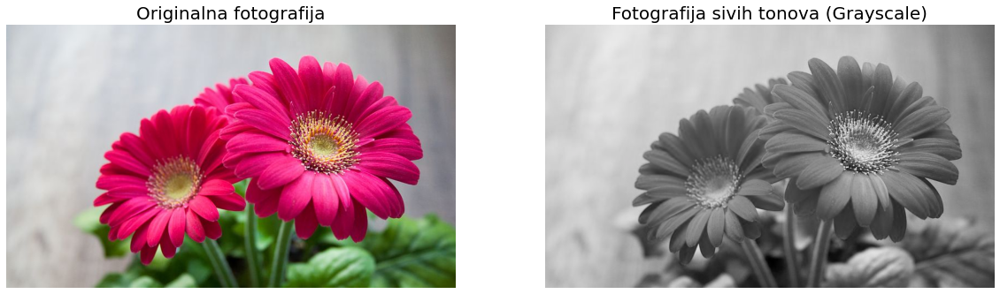

In [ ]:
# Učitavanje potrebnih bilblioteka
%matplotlib inline
import numpy as np
from skimage import img_as_float
from skimage.io import imread
from skimage.color import rgb2lab, lab2rgb
from skimage.util import invert
from skimage.exposure import equalize_hist
import matplotlib.pylab as plt

# 1. Učitavanje fotografije i transformacija iz RGB u Lab prostor boja
im = imread('images/flowers.png')
im1 = rgb2lab(im)

# 2. Podešavanje vrednosti kanala (drugi i treći kanal) na nule
im1[...,1]  = im1[...,2] = 0

# 3. Transformacija fotografije nazad u RGB prostor boja i dolazak do fotografije sivih tonova
im1 = lab2rgb(im1)

# 4. Iscrtavanje ulazne i izlazne fotografije
plt.figure(figsize=(20,10))
plt.subplot(121), plt.imshow(im), plt.axis('off'), plt.title('Originalna fotografija', size=20)
plt.subplot(122), plt.imshow(im1), plt.axis('off'), plt.title('Fotografija sivih tonova (Grayscale)', size=20)
plt.show()

/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 114864 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


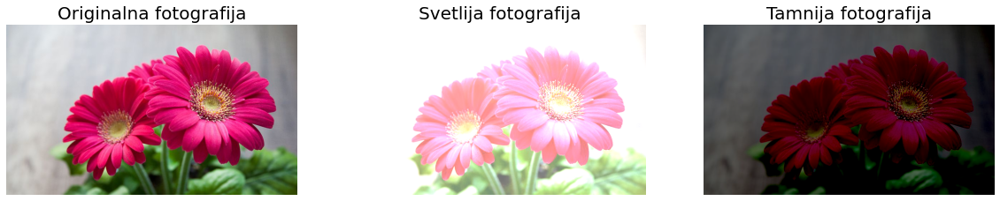

In [ ]:
plt.figure(figsize=(20,5))
# iscrtavanje originalne fotografije
plt.subplot(131), plt.imshow(im), plt.axis('off'), plt.title('Originalna fotografija', size=20)

# 1. Transformacija učitane slike iz RGB u Lab prostor boja i povećanje vrednosti (za 50) na prvom kanalu
im1 = rgb2lab(im)
im1[...,0] = im1[...,0] + 50 

# 2. Transformacija fotografije nazad u RGB prostor boja
im1 = lab2rgb(im1)

# iscrtavanje te fotografije
plt.subplot(132), plt.imshow(im1), plt.axis('off'), plt.title('Svetlija fotografija', size=20)

# 3. Isto kao u prethodnom primeru, samo je potrebno smanjiti vrednosti (-50) na prvom kanalu
im1 = rgb2lab(im)
im1[...,0] = im1[...,0] - 50 
im1 = lab2rgb(im1)

plt.subplot(133), plt.imshow(im1), plt.axis('off'), plt.title('Tamnija fotografija', size=20)

plt.show()

/usr/local/lib/python3.6/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 146 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


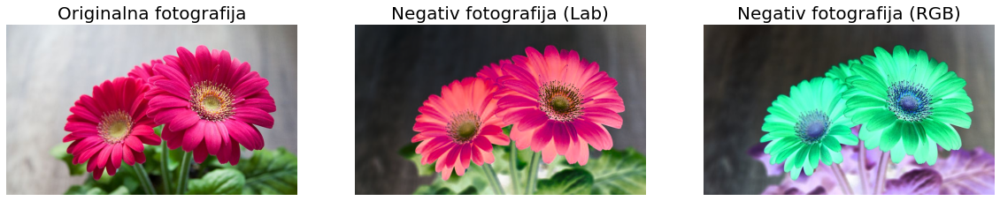

In [ ]:
# Pretvaranje ulazne fotografije u Lab prostor boja i pravljenje negativa u Lab prostoru boja.
im1 = rgb2lab(im)
im1[...,0] = np.max(im1[...,0]) - im1[...,0]
im1 = lab2rgb(im1)

plt.figure(figsize=(20,6))
plt.subplot(131), plt.imshow(im), plt.axis('off'), plt.title('Originalna fotografija', size=20)
plt.subplot(132), plt.imshow(im1), plt.axis('off'), plt.title('Negativ fotografija (Lab)', size=20)

# https://scikit-image.org/docs/dev/api/skimage.util.html#skimage.util.invert
plt.subplot(133), plt.imshow(invert(im)), plt.axis('off'), plt.title('Negativ fotografija (RGB)', size=20)
plt.show()

### *Afina Transformacija*

Affine transformacija je geometrijska transformacija koja čuva tačke, linije i ravni. 
Linije koje su paralelne pre transformacije ostaju paralelne nakon primene transformacije. 
Za svaki piksel x na slici, afinska transformacija može biti predstavljena preslikavanjem,

**x | → Mx + b**, gde je **M linearna transformacija** (matrica), a **b je vektor nagiba**.

To je ekvivalentno prevođenju, rotaciji, skaliranju, smicanju i simetriji na slici. Isto kao i transformacija krutog tela, ono može da održi paralelni i kolinearni odnos između linija. Odnosno, originalna paralelna ravna linija je i dalje paralelna nakon promene. Ali za razliku od krute transformacije tela, dužina između segmenata linija će se promeniti.

Afina transformacija znači da u geometriji vektorski prostor prolazi linearnu transformaciju praćenu translacijom da bi se transformisao u drugi vektorski prostor. U slučaju konačnih dimenzija, svaka afina transformacija može se dati matricom A i vektorom b, koji se mogu zapisati kao A i dodatna kolona b. Afina transformacija odgovara množenju matrice i vektora, a kompozicija afine transformacije odgovara običnom množenju matrice, sve dok je dodatni red dodan na dno matrice, ovaj red je sve 0 osim krajnji desni je 1.


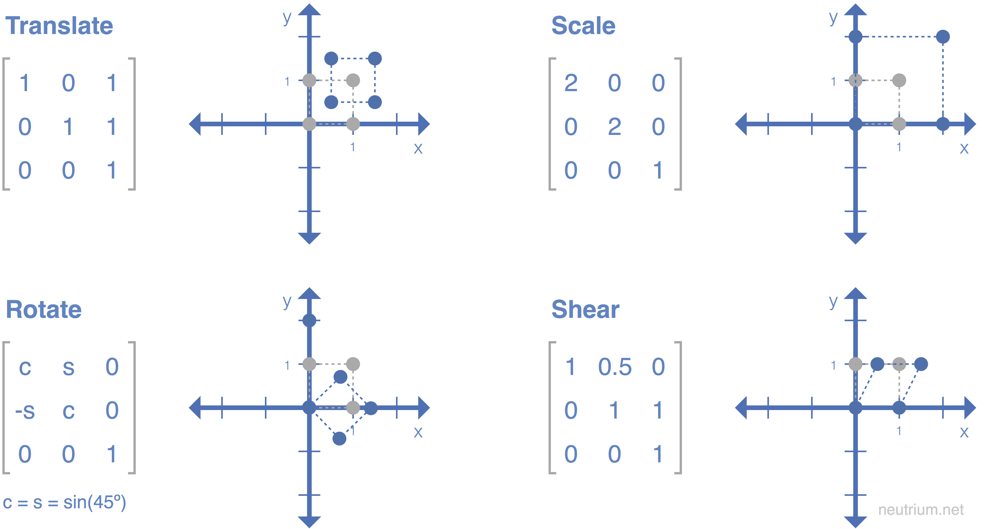

In [ ]:
# Gif primer nekih Afinih transformacija
from IPython.display import Image
Image('images/res/affine-transformation-all.png')

In [ ]:
# Gif primer nekih Afinih transformacija
from IPython.display import Image
Image(url='https://www.scilab.org/sites/default/files/affine-transform.gif')

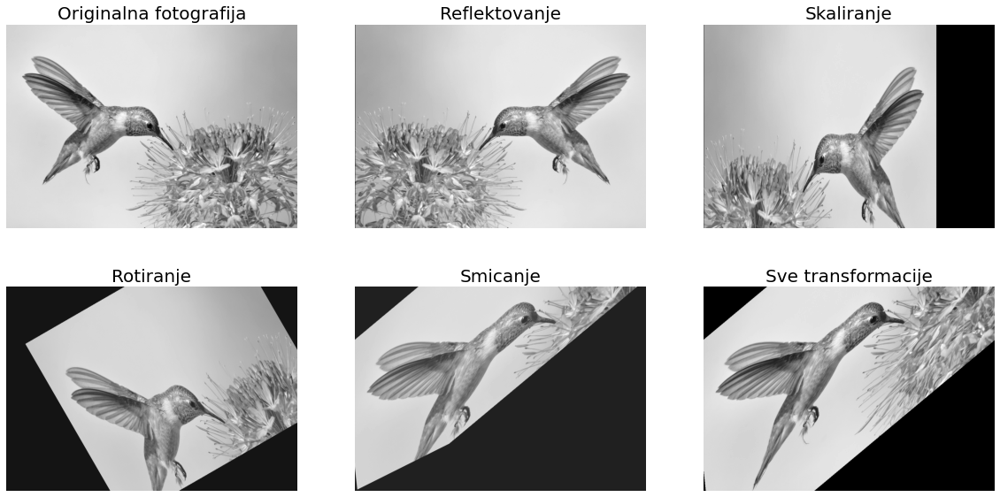

In [ ]:
# Učitavanje potrebnih bilblioteka
import numpy as np
from scipy import ndimage as ndi
from skimage.io import imread
from skimage.color import rgb2gray

# 1. Učitavanje ulazne fotografije, transformacija u sive tonove i uzimanje dimenzije fotografije.
img = imread('images/humming.png')
img = rgb2gray(img)
w, h = img.shape

plt.figure(figsize=(20,10))

# 2. Primena identity transformacije
# 1  0  0
# 0  1  0
# 0  0  1
mat_identity = np.array([[1,0,0],[0,1,0],[0,0,1]])
img1 = ndi.affine_transform(img, mat_identity)
plt.subplot(231), plt.imshow(img1, cmap='gray'), plt.axis('off'), plt.title('Originalna fotografija', size=20)

# 3. Primena refleksione simetrije (po x osi)
# 1  0  0
# 0 -1  0
# 0  0  1
mat_reflect = np.array([[1,0,0],[0,-1,0],[0,0,1]]) @ np.array([[1,0,0],[0,1,-h],[0,0,1]])
img1 = ndi.affine_transform(img1, mat_reflect) # offset=(0,h)
plt.subplot(232), plt.imshow(img1, cmap='gray'), plt.axis('off'), plt.title('Reflektovanje', size=20)

# 4. Skaliranje fotografije (0.75 puta duž x ose i 1.25 puta duž y ose)
# 0.75  0     0
# 0     1.25  0
# 0     0     1
mat_scale = np.array([[0.75,0,0],[0,1.25,0],[0,0,1]])
img1 = ndi.affine_transform(img1, mat_scale)
plt.subplot(233), plt.imshow(img1, cmap='gray'), plt.axis('off'), plt.title('Skaliranje', size=20) 

# 5. Rotiranje fotografije za 30° u smeru suprotnom od kazaljke na satu. 
# To je složena operacija - prvo je potrebno pomeriti/centrirati fotografiju, primeniti rotaciju, a zatim primeniti inverzni pomak
# θ
theta = np.pi/6
mat_rotate = np.array([[1,0,w/2],[0,1,h/2],[0,0,1]]) @ np.array([[np.cos(theta),np.sin(theta),0],[np.sin(theta),-np.cos(theta),0],[0,0,1]]) @ np.array([[1,0,-w/2],[0,1,-h/2],[0,0,1]])
img1 = ndi.affine_transform(img1, mat_rotate)
plt.subplot(234), plt.imshow(img1, cmap='gray'), plt.axis('off'), plt.title('Rotiranje', size=20) 

# 4. Primena shear transformacije na fotografiju (smicanje)
# 1  λ  0
# λ  1  0
# 0  0  1
lambda1 = 0.5
mat_shear = np.array([[1,lambda1,0],[lambda1,1,0],[0,0,1]])
img1 = ndi.affine_transform(img1, mat_shear)
plt.subplot(235), plt.imshow(img1, cmap='gray'), plt.axis('off'), plt.title('Smicanje', size=20) 

# 5. Primena svih transformacija zajedno (u odgovarajućem redosledu)
mat_all = mat_identity @ mat_reflect @ mat_scale @ mat_rotate @ mat_shear
plt.subplot(236), plt.imshow(ndi.affine_transform(img, mat_all), cmap='gray'), plt.axis('off'), plt.title('Sve transformacije', size=20) 

# Iscrtavanje
plt.show()

### Projekcija perspektive i Homografija

Cilj perspektivne (projektivne) transformacije je procena homografije (matrice, H) iz tačkastih korespondencija između dve slike. Budući da matrica ima dubinu polja (DOF) osam, potrebna su vam najmanje četiri para tačaka da biste izračunali homografsku matricu iz dve slike. Sledeći dijagram prikazuje osnovne pojmove potrebne za izračunavanje homografske matrice:


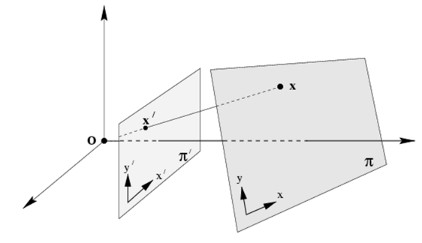

In [ ]:
# Primer Homografije
from IPython.display import Image
Image('images/res/homography_transformation.jpg')

True


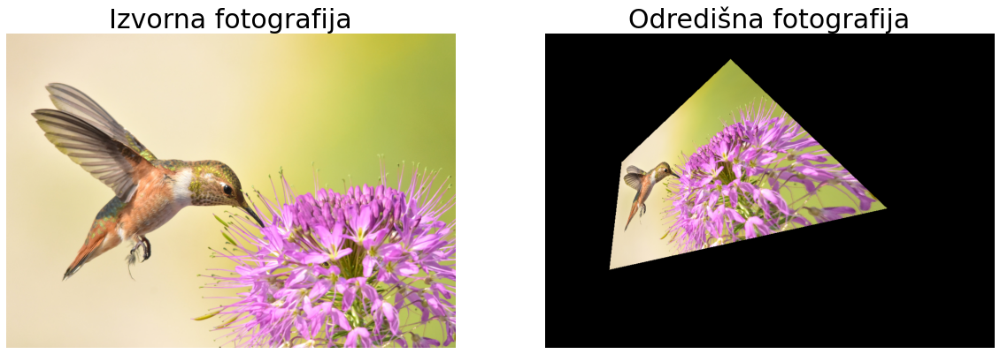

In [ ]:
from skimage.transform import ProjectiveTransform
from skimage.io import imread
from skimage.color import rgb2gray
import numpy as np
import matplotlib.pylab as plt

# 1. Učitavanje izvorne fotografije i kreiranje odredišne fotografije pomoću np.zeros() funkcije:
im_src = (imread('images/humming.png'))
height, width, dim = im_src.shape
im_dst = np.zeros((height, width, dim))

# 2. Kreiranje instance klase ProjectiveTransform:
pt = ProjectiveTransform()

# 3.
"""
  Postavljamo četiri para podudarnih parova između izvorne i odredišne fotografije
  za automatsku procenu matrice homografije, H.
  Ovde su četiri ugla odredišne fotografije i četiri ugla izvorne (humming.png)
  kolibri su dati kao tačke podudaranja, kao što je prikazano u sledećem bloku koda:
"""
src = np.array([[   0.,    0.],
       [height-1,    0.],
       [height-1,  width-1],
       [   0.,  width-1]])
dst = np.array([[ 295., 174.],
       [ 540., 146. ],
       [ 400., 777.],
       [  60., 422.]])

print(pt.estimate(src, dst))

# 4. Dobijamo izvorni indeks piksela koji odgovara svakom indeksu piksela u odredištu:
x, y = np.mgrid[:height, :width]
# reshape(-1, 1) . Postavili smo da imamo 1 kolonu ali nam je broj redova nepoznat
dst_indices=np.hstack((x.reshape(-1, 1), y.reshape(-1,1))) 
src_indices = np.round(pt.inverse(dst_indices), 0).astype(int)
valid_idx = np.where((src_indices[:,0] < height) & (src_indices[:,1] < width) & (src_indices[:,0] >= 0) & (src_indices[:,1] >= 0))
dst_indicies_valid = dst_indices[valid_idx]
src_indicies_valid = src_indices[valid_idx]

# 5. Kopiranje piksela iz ulazne u odredišnu fotografiju:
im_dst[dst_indicies_valid[:,0],dst_indicies_valid[:,1]] = im_src[src_indicies_valid[:,0],src_indicies_valid[:,1]]
im_dst = im_dst.astype(np.uint8) 


plt.figure(figsize=(20,10))
plt.subplot(121), plt.imshow(im_src, cmap='gray'), plt.axis('off'), plt.title('Izvorna fotografija', size=30)
plt.subplot(122), plt.imshow(im_dst, cmap='gray'), plt.axis('off'), plt.title('Odredišna fotografija', size=30)
plt.show()

True


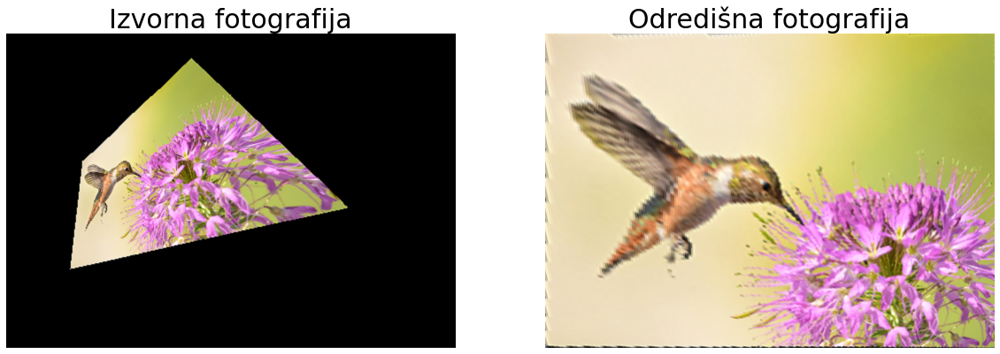

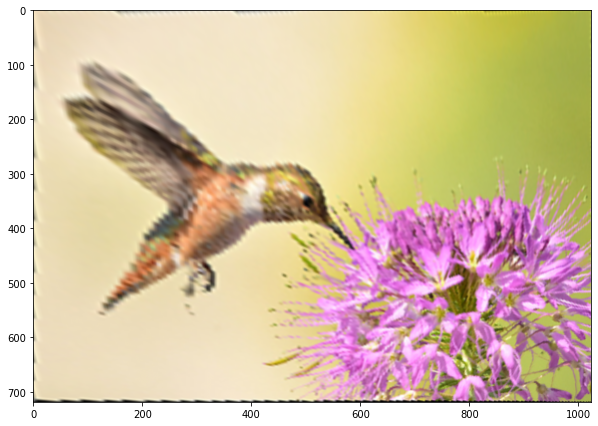

In [ ]:
from skimage.transform import ProjectiveTransform, warp
from skimage.io import imread
from skimage.color import rgb2gray
import numpy as np
import matplotlib.pylab as plt

# Postupak kao u prošlom primeru

im_src = (imread('images/humming2.png'))
height, width, dim = im_src.shape
im_dst = np.zeros((height, width, dim))

pt = ProjectiveTransform()
src = np.array([[ 295., 174.],
       [ 540., 146. ],
       [ 400., 777.],
       [  60., 422.]])
dst = np.array([[   0.,    0.],
       [height-1,    0.],
       [height-1,  width-1],
       [   0.,  width-1]])

print(pt.estimate(src, dst))

x, y = np.mgrid[:height, :width]
dst_indices = np.hstack((x.reshape(-1, 1), y.reshape(-1,1))) 
src_indices = np.round(pt.inverse(dst_indices), 0).astype(int)
valid_idx = np.where((src_indices[:,0] < height) & (src_indices[:,1] < width) & (src_indices[:,0] >= 0) & (src_indices[:,1] >= 0))
dst_indicies_valid = dst_indices[valid_idx]
src_indicies_valid = src_indices[valid_idx]
im_dst[dst_indicies_valid[:,0],dst_indicies_valid[:,1]] = im_src[src_indicies_valid[:,0],src_indicies_valid[:,1]]
im_dst = im_dst.astype(np.uint8) 
plt.figure(figsize=(20,10))
plt.subplot(121), plt.imshow(im_src, cmap='gray'), plt.axis('off'), plt.title('Izvorna fotografija', size=30)
plt.subplot(122), plt.imshow(im_dst, cmap='gray'), plt.axis('off'), plt.title('Odredišna fotografija', size=30)
plt.show()
plt.figure(figsize=(10,10))
plt.imshow(warp(im_src.transpose(1,0,2), np.linalg.inv(pt.params), output_shape=(width,height)).transpose(1,0,2))
plt.show()

### Skice sa fotografije

Instalacija modula "medpy" na colab


In [ ]:
!pip3 install medpy

     |████████████████████████████████| 153kB 9.2MB/s 
     |████████████████████████████████| 47.4MB 85kB/s 
  Created wheel for medpy: filename=MedPy-0.4.0-cp36-cp36m-linux_x86_64.whl size=753414 sha256=afda22d77f6c98746c936854e5a7bd89b963b0d9603e2a36fdbd61792e76b288
  Stored in directory: /root/.cache/pip/wheels/8c/c9/9c/2c6281c7a72b9fb1570862a4f028af7ce38405008354fbf870
Successfully built medpy


/usr/local/lib/python3.6/dist-packages/medpy/filter/smoothing.py:155: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  deltas[i][slicer] = numpy.diff(out, axis=i)
/usr/local/lib/python3.6/dist-packages/medpy/filter/smoothing.py:164: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  matrices[i][slicer] = numpy.diff(matrices[i], axis=i)


4.625377282646626 0.0


<Figure size 432x288 with 0 Axes>

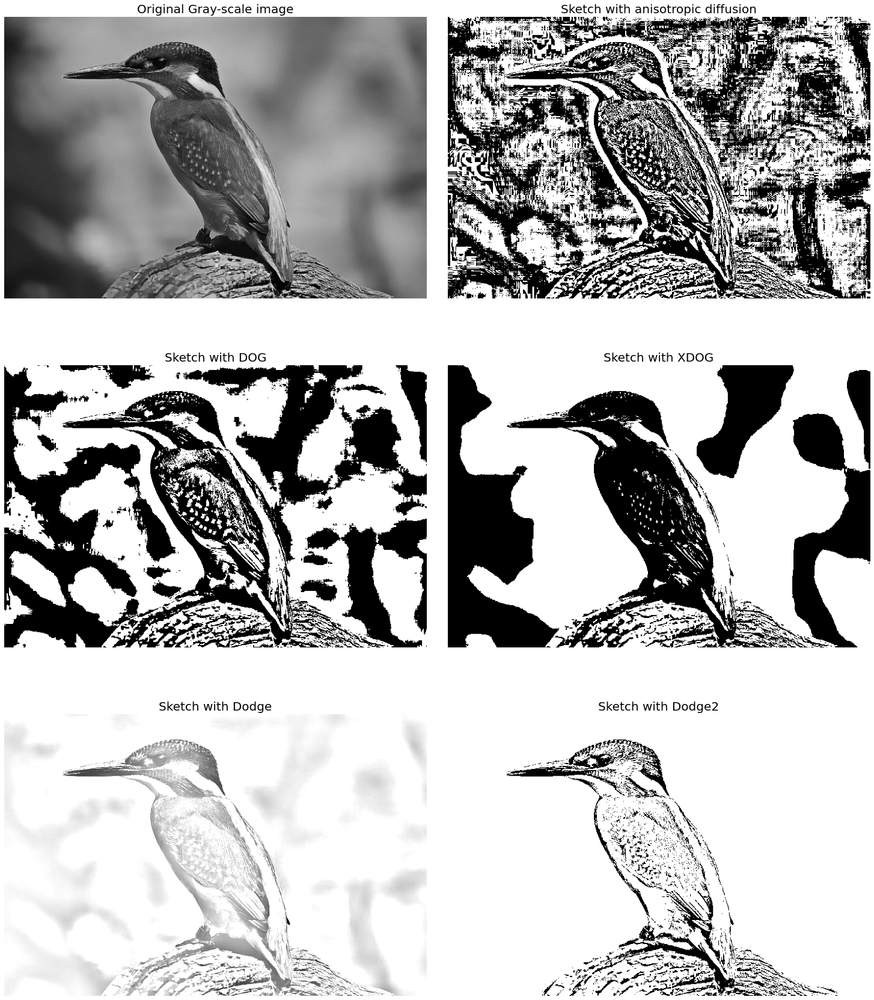

In [ ]:
# Učitavanje potrebnih bilblioteka
%matplotlib inline
import numpy as np
from skimage.io import imread
from skimage.color import rgb2gray
from skimage import util
from skimage import img_as_float
import matplotlib.pylab as plt
from medpy.filter.smoothing import anisotropic_diffusion
from skimage.filters import gaussian, threshold_otsu

# 1. Definišemo funkciju normalize() za primenu min-max normalizacije u fotografiji
def normalize(img):
    return (img-np.min(img))/(np.max(img)-np.min(img))

# 2. Implementacija funkcije sketch() koja uzima fotografiju i izvučene ivice kao ulazni parametar:
def sketch(img, edges):
    output = np.multiply(img, edges)
    output[output>1]=1
    output[edges==1]=1
    #output = normalize(output)
    return output

# 3. Implementacija funkcije za izdvajanje ivica sa fotografije anizotropna difuzija:
"""
 Anizotropna difuzija -
 (tehnika čiji je cilj smanjenje šuma slike bez uklanjanja značajnih delova sadržaja slike, 
 obično ivica, linija ili drugih detalja koji su važni za interpretaciju slike)
"""
def edges_with_anisotropic_diffusion(img, niter=100, kappa=10, gamma=0.1):
    #img = gaussian(img, sigma=0.05)
    output = img - anisotropic_diffusion(img, niter=niter, kappa=kappa, gamma=gamma, voxelspacing=None, option=1)
    output[output > 0] = 1
    output[output < 0] = 0
    #output = np.clip(output, 0, 1)
    #thresh = threshold_otsu(output)
    #output = np.invert(output > thresh)
    return output

# 4. Implementacija funkcije za izvlačenje ivica sa fotografije pomoću dodge-a operacija (postoje dve implementacije)
def edges_with_dodge2(img):
    img_blurred = gaussian(util.invert(img), sigma=5)
    output = np.divide(img, util.invert(img_blurred) + 0.001) # avoid division by zero
    print(np.max(output), np.min(output))
    output = normalize(output)
    thresh = threshold_otsu(output)
    output = output > thresh
    return output


def sketch_with_dodge(img):
    orig = img
    blur = gaussian(util.invert(img), sigma=20)
    result=blur/util.invert(orig) 
    result[result>1]=1
    result[orig==1]=1
    return result

# 5. Implementacija funkcije za izdvajanje ivica sa fotografije sa razlikom od Gausove operacija (DOG):
def edges_with_DOG(img, k = 200, gamma = 1):
    sigma = 0.5
    output = gaussian(img, sigma=sigma) - gamma*gaussian(img, sigma=k*sigma)
    output[output > 0] = 1
    output[output < 0] = 0 
    return output

# 6. Implementacija funkcije za izradu skica sa fotografije pomoću operacija proširene razlike Gaussa (XDOG):
def sketch_with_XDOG(image, epsilon=0.01):
  """
  Izračunava proširenu razliku Gausa (XDoG) za datu fotografiju. 
  Ovo se vrši uzimanjem redovne razlike Gausa, prelazeći je
  na nekoj vrednosti, i primenom funkcije tangens hiperbolnog praga vrednosti.
  fotografija: n x m jednokanalna matrica.
  epsilon: vrednost pomaka pri računanju hiperbolnog tangensa.
  vraća: n x m jednokanalna matrica koja predstavlja XDoG.
  """
  phi = 10

  difference = edges_with_DOG(image, 200, 0.98).astype(np.uint8)
  #difference = sketch(image, difference)
  #difference = normalize(difference)  

  for i in range(0, len(difference)):
    for j in range(0, len(difference[0])):
      if difference[i][j] >= epsilon:
        difference[i][j] = 1
      else:
        ht = np.tanh(phi*(difference[i][j] - epsilon))
        difference[i][j] = 1 + ht
  difference = normalize(difference)  
  return difference

# iscrtavanje rešenja
def plot_sketches(img_file):
    img = rgb2gray(imread(img_file))
    plt.figure(figsize=(20,25))
    output_aniso = sketch(img, edges_with_anisotropic_diffusion(img))
    output_dog = sketch(img, edges_with_DOG(img, k=25))
    output_xdog = sketch_with_XDOG(img)
    output_dodge = sketch_with_dodge(img)
    output_dodge2 = sketch(img, edges_with_dodge2(img))
    plt.subplots_adjust(left=0, right=1, bottom=0, top=0.95, hspace=0.05, wspace=0.05) 
    plt.subplot(321), plt.imshow(img), plt.axis('off')
    plt.title('Originalna Gray-scale fotografija', size=20)
    plt.subplot(322), plt.imshow(output_aniso), plt.axis('off')
    plt.title('Skica sa anizotropnom difuzijom', size=20)
    plt.subplot(323), plt.imshow(output_dog), plt.axis('off')
    plt.title('Skica sa DOG', size=20)
    plt.subplot(324), plt.imshow(output_xdog), plt.axis('off')
    plt.title('Skica sa XDOG', size=20)
    plt.subplot(325), plt.imshow(output_dodge), plt.axis('off')
    plt.title('Skica sa Dodge', size=20)
    plt.subplot(326), plt.imshow(output_dodge2), plt.axis('off')
    plt.title('Skica sa Dodge2', size=20)
    #plt.show()
    plt.savefig(img_file.split('.')[0] + '_sketches_all.png', bbox_in='tight')

plt.gray()
img = 'images/bird.png'
plot_sketches(img)

### Cartoonizing / Ilustrovanje fotografija - Crtane fotografije

U ovom delu ćete naučiti kakoda  na slici stvorite crtane slike ravne teksture. Opet, postoji više načina da se to učini, ovde ćemo naučiti kako se to radi sa bilateralnim filterima koji čuvaju ivice.

Kao što je ranije objašnjeno, funkcije bilateralFilter(), medianBlur(), adaptiveThreshold() i bitwise_and() iz OpenCV-Python-a bile su ključne funkcije koje se prvo koriste za uklanjanje slabih ivica, a zatim za konvertovanje u ravnu teksturu i na kraju za poboljšanje istaknutih ivica slika.
Funkcija bilateralFilter() iz OpenCV-Python korišćena je za zaglađivanje tekstura, a istovremeno zadržavanje ivica prilično oštrim:
*   Što je veća vrednost parametra sigmaColor, to će se više boja piksela u 
susedstvu pomešati. Ovo će proizvesti veća područja polujednake boje na izlaznoj slici.
*   Što je veća vrednost parametra sigmaSpace, to će pikseli sličnih boja više uticati jedni na druge.

Slika je uzorački umanjena da bi se stvorila slikovna piramida (više ćete videti u sledećem poglavlju). 
Dalje, ponovljena primena malih bilateralnih filtera korišćena je za uklanjanje nevažnih detalja. 
Naknadno uzorkovanje je korišćeno za promenu veličine slike na prvobitnu veličinu.
Na kraju je primenjen medianBlur (da bi se izravnala tekstura), praćen maskiranjem originalne slike binarnom slikom dobijenom adaptivnim graničnim pragom.

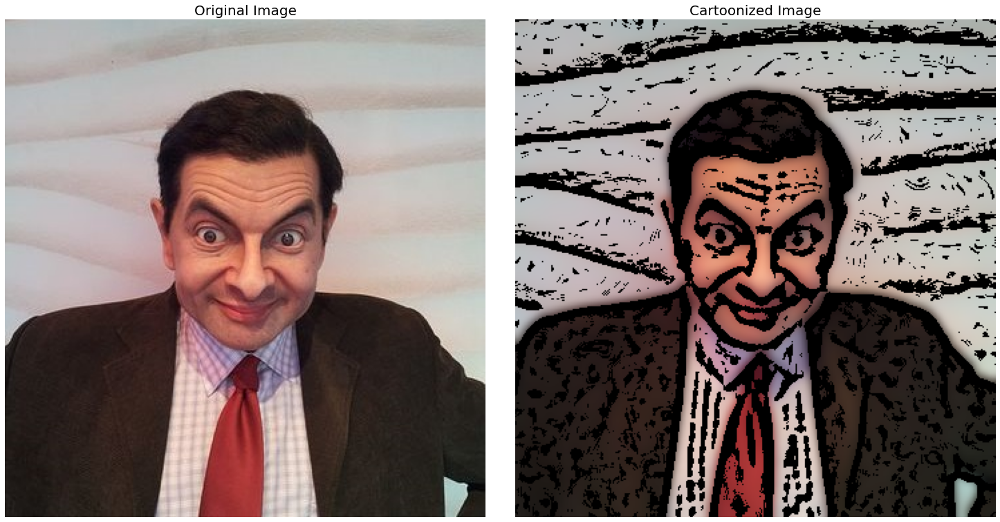

In [ ]:
import cv2
import numpy as np
import matplotlib.pylab as plt

"""
  1. Učitavamo ulaznu fotografiju i inicijalizujemo parametre koji će se kasnije koristiti:
"""
img = plt.imread("images/bean.png")

num_down = 2       # number of downsampling steps
num_bilateral = 7  # number of bilateral filtering steps

w, h, _ = img.shape
  
"""
  2. Upotreba Gaussove piramide za smanjivanje veličine fotografije (ubrzavanje narednih operacija):
"""
img_color = np.copy(img)
for _ in range(num_down):
    img_color = cv2.pyrDown(img_color)
 
 """
  3. Iterativna primenita bilateralnih filtera (sa malim prečnikom). 
     Parametar d predstavlja prečnik susedstva za svaki piksel, 
     gde parametri sigmaColor i sigmaSpace predstavljaju filter 
     sigma u boji i koordinatnom prostoru redom.

     Napomena: Bilateralni filter uklanja teksturu, kreira ravni intenzitet regije i nove konture
 """
for _ in range(num_bilateral):
    img_color = cv2.bilateralFilter(img_color, d=9,
                                    sigmaColor=0.1,
                                    sigmaSpace=0.01)

# 4. Uvećavanje uzorka na prvobitnu veličinu:
for _ in range(num_down):
    img_color = cv2.pyrUp(img_color)
    
img_color = cv2.resize(img_color, (img.shape[1], img.shape[0]))

# 5. Dobijenu fotografiju u poslednjem koraku konvertuje u izlaznu fotografiju i zamućuje je pomoću srednjeg filtera:
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
img_blur = cv2.medianBlur((255*img_gray).astype(np.uint8), 7) # convert float32 to uint8

# 6. Otkrivanje i pojačavanje ivica
img_edge = cv2.adaptiveThreshold((255*img_blur).astype(np.uint8), 255,
                                 cv2.ADAPTIVE_THRESH_MEAN_C, #ADAPTIVE_THRESH_GAUSSIAN_C, 
                                 cv2.THRESH_BINARY_INV,
                                 blockSize=11,
                                 C=0)

# 7. Konvertuje grayscale fotografiju (u sivim tonovima) ivica u RGB fotografiju, 
#    zatim proračunavamo bitwise AND sa RGB fotografijom, da bi dobili konačnu izlaznu "crtanu" fotografiju
img_edge = cv2.cvtColor(img_edge, cv2.COLOR_GRAY2RGB)

img_cartoon = cv2.bitwise_and((255*img_color).astype(np.uint8), img_edge)

# prikaz
fig = plt.figure(figsize=(20,10))
fig.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0.05, wspace=0.05) 
plt.subplot(121)
plt.imshow(img)
plt.axis('off')
plt.title('Originalna fotografija', size=20)
plt.subplot(122)
plt.imshow(img_cartoon)
plt.axis('off')
plt.title('Crtana fotografija', size=20)

plt.show()

/usr/local/lib/python3.6/dist-packages/medpy/filter/smoothing.py:155: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  deltas[i][slicer] = numpy.diff(out, axis=i)
/usr/local/lib/python3.6/dist-packages/medpy/filter/smoothing.py:164: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  matrices[i][slicer] = numpy.diff(matrices[i], axis=i)


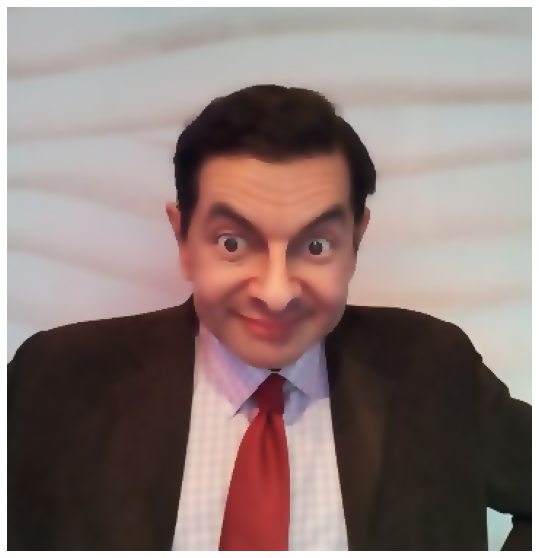

In [ ]:
import numpy as np
import matplotlib.pylab as plt
from medpy.filter.smoothing import anisotropic_diffusion

img = plt.imread("images/bean.png")
output = img.copy()
for i in range(3):
    output[...,i] = anisotropic_diffusion(img[...,i], niter=50, kappa=0.1, gamma=0.05, voxelspacing=None, option=1)
plt.figure(figsize=(10,10))
plt.imshow(output), plt.axis('off')
plt.show()

### Skice olovke, skice olovke u boji i slike u stilizovanim bojama sa opencv-python bibliotekom

Koristeći OpenCV i Python, RGB slika u boji može se pretvoriti u skicu olovke u četiri jednostavna koraka:

1.  Pretvorite RGB sliku u boji u sive tonove.
2.  Obrnite sliku sive da biste dobili negativ.
3.  Primenite Gaussovu zamućenost na negativ iz koraka 2.
4.  Spojite sivu sliku iz koraka 1 sa zamućenim negativom iz koraka 3.


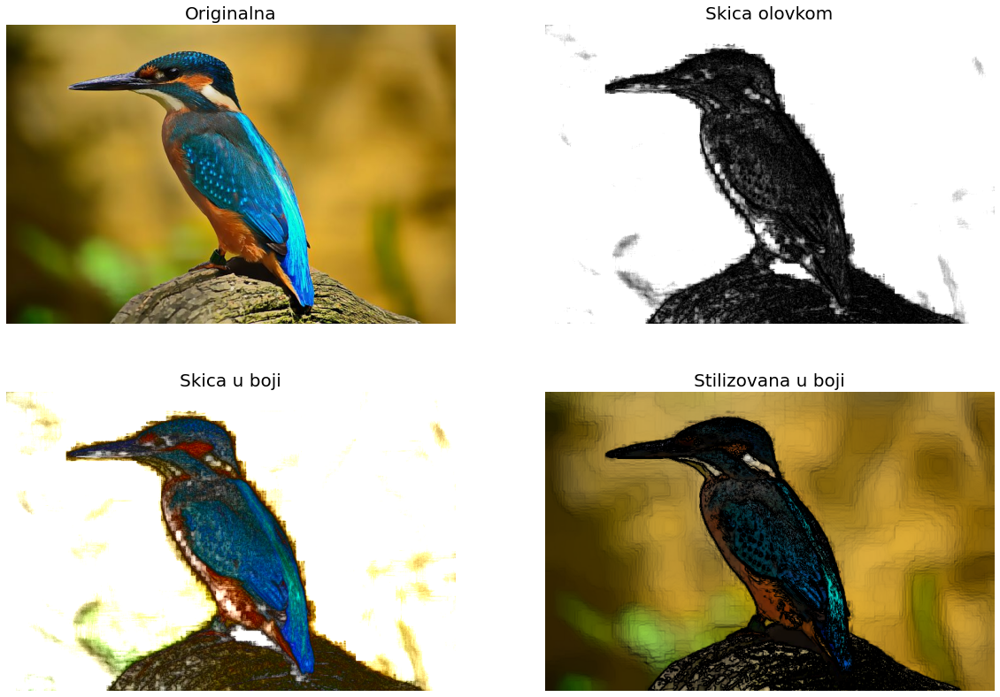

In [ ]:
import cv2
import matplotlib.pylab as plt
src = cv2.imread('images/bird.png')
#dst = cv2.detailEnhance(src, sigma_s=10, sigma_r=0.15)
dst_sketch, dst_color_sketch = cv2.pencilSketch(src, sigma_s=50, sigma_r=0.05, shade_factor=0.05)
dst_water_color = cv2.stylization(src, sigma_s=50, sigma_r=0.05)
plt.figure(figsize=(20,14))
plt.subplot(221), plt.imshow(cv2.cvtColor(src, cv2.COLOR_BGR2RGB)), plt.axis('off'), plt.title('Originalna', size=20)
plt.subplot(222), plt.imshow(dst_sketch, cmap='gray'), plt.axis('off'), plt.title('Skica olovkom', size=20)
plt.subplot(223), plt.imshow(cv2.cvtColor(dst_color_sketch, cv2.COLOR_BGR2RGB)), plt.axis('off'), plt.title('Skica u boji', size=20)
plt.subplot(224), plt.imshow(cv2.cvtColor(dst_water_color, cv2.COLOR_BGR2RGB)), plt.axis('off'), plt.title('Stilizovana u boji', size=20)
plt.show()

### Pointilizam - Divizionizam



Pointilizam je tehnika slikanja u kojoj se male različite tačke boje primenjuju u obrascima da bi se stvorila slika. Ova tehnika se oslanja na sposobnost oka i uma gledaoca da stavi tačke u boji u puniji opseg tonova. Supostavljanje različitih boja čini ih živopisnijima, dajući celoj slici veću živost. 
Simulacija procesa slikanja vrši se u tri koraka:
*   Stvaranje palete boja - Prva stvar koju moramo da odlučimo koje će boje biti u paleti našeg „virtuelnog umetnika“. Moramo da odaberemo skup boja koji je koherentan sa bojama slike, ali opet živ i jasan. Počinjemo pokretanjem k-means da bismo izabrali n = 20 dominantnih boja sa slike. „Suprotstavljena“ priroda k-means stvara izrazite boje koje se koncentrišu oko najčešćih boja na slici. Da bismo dodali živost, paletu uvećavamo dodavanjem nekih varijacija boja koje je izabrao k-means. Prvi red sledeće slike predstavlja paletu.
izračunatu pomoću k-means , sledeći redovi sadrže varijacije boja uključene u završnu paletu.
*   Izračunavanje veličine i dužine poteza - Da bismo konačnom rezultatu dali dinamičniji izgled, umesto kružnih tačaka možemo koristiti male zasebne poteze u boji. Ovo je zapravo tehnika koja se koristi na mnogim pointilističkim slikama! Želimo da pravac poteza četkom bude u skladu sa sadržajem slike i da koristimo duže poteze za prikazivanje ivica. Iz tog razloga koristimo gradijent slike da odredimo dužinu i smer svakog poteza boje.
*   Stvarno slikanje

Za svaki potez moramo odrediti:
*   Položaj
*   Orijentacija i dužina svakog poteza
*   Koju boju palete koristiti


Instalacija modula "pointillism" na colab

In [ ]:
!pip install pointillism

  Created wheel for pointillism: filename=pointillism-0.1.5-cp36-none-any.whl size=12522 sha256=8a4689d03ca20941eca8cd01d40a44f3c6304585473e45174e5b8306e127b81e
  Stored in directory: /root/.cache/pip/wheels/fd/70/3a/fa87fef4a6adba8782fd159be5b4dc7508cb760ca2e203c12a
Successfully built pointillism


done in 2.26 seconds
images/elephants.png


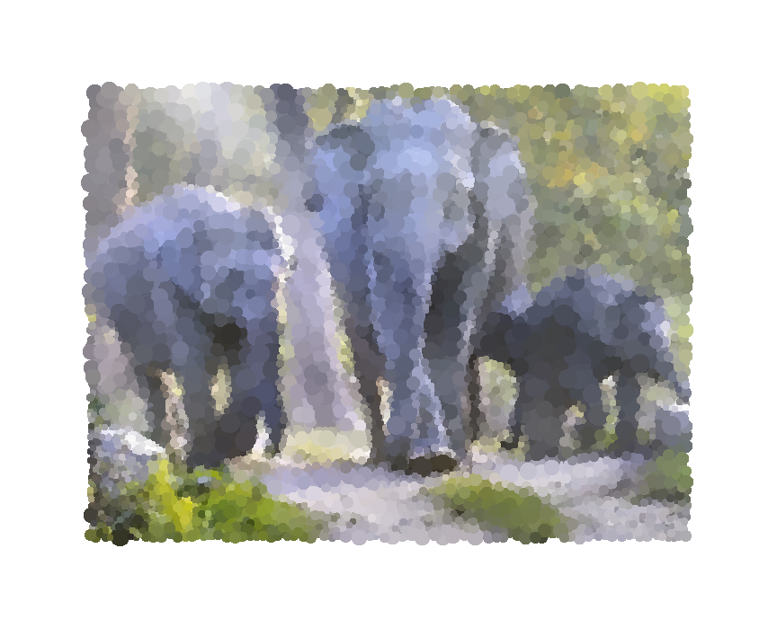

In [ ]:
import pointillism as pt
point = pt.image(location='images/elephants.png', debug = True)
point.make('balanced')
point.display()
#point.save_out(location='images', suffix='basic test')

### Simuliranje svetlosne umetnosti / duga ekspozicija

Duga ekspozicija (ili svetlosna umetnost) odnosi se na proces stvaranja fotografije koja beleži efekat prolaznog vremena. Neki od popularnih primera primena fotografija sa dugim ekspozicijama su svilenkasto glatka voda i jednostruko tračno osvetljenje autoputeva sa automobilskim farovima. U ovom delu simuliraćemo dugu ekspoziciju prosečavanjem okvira slike iz video zapisa.

Funkcija VideoCapture() iz OpenCV-Python je korišćena za kreiranje objekta VideoCapture sa video datotekom kao ulazom. Tada je metoda read() tog objekta korišćena za hvatanje kadrova iz video zapisa.
Funkcije imread() i imwrite() iz OpenCV-Python su korišćene za čitanje / pisanje slika sa / na disk.
Funkcija cv2.split() je korišćena za podelu RGB slike na pojedinačne kanale u boji, dok je funkcija cv2.merge() korišćena za njihovo ponovno kombinovanje u RGB sliku.
Slaganje fokusa (poznato i kao povećana dubina polja) je tehnika (u obradi slika / računarskoj fotografiji) koja uzima više slika (istog predmeta, ali snimljenih na različitim udaljenostima fokusa) kao ulaz, a zatim stvara izlaznu sliku sa većim DOF nego bilo koja pojedinačna izvorna slika kombinovanjem ulaznih slika. Možemo simulirati slaganje fokusa u Python-u.


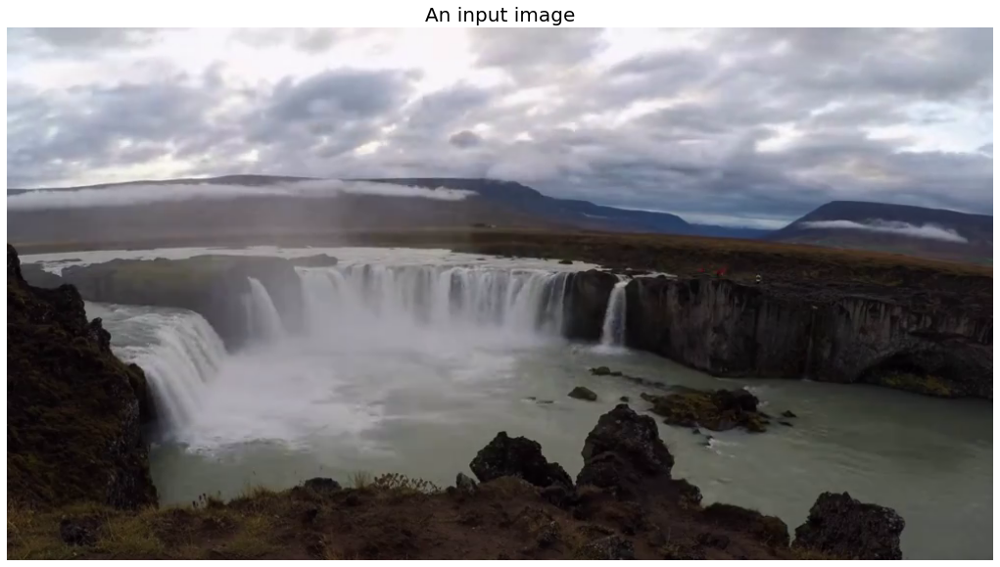

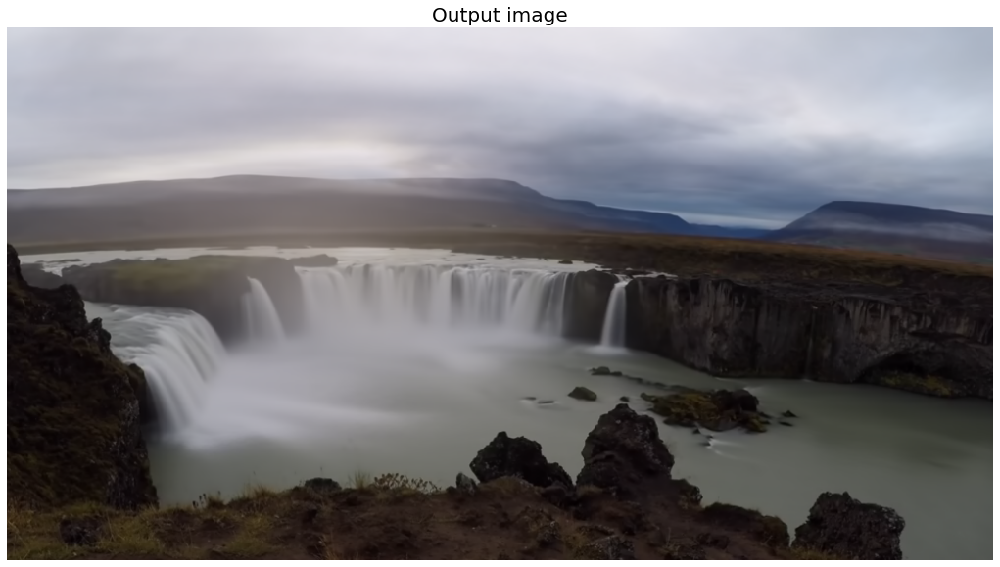

True

In [ ]:
from glob import glob
import cv2
import numpy as np
import matplotlib.pylab as plt

# 1. Implementacija funkcije ektract_frames() 
"""
  Funkcija izdvaja prvih 200 frejmova (najviše) iz video zapisa 
  prosleđenog kao ulazni parametar funkciji:
"""
def extract_frames(vid_file):
    vidcap = cv2.VideoCapture(vid_file)
    success,image = vidcap.read()
    i = 1
    success = True
    while success and i <= 200:
      cv2.imwrite('images/exposure/vid_{}.png'.format(i), image)
      success,image = vidcap.read()
      i += 1
# 2.
"""
  Poziv funkcije da sačuva sve frejmove (kao .jpg) izvučene iz video zapisa
  vodopad u Godafostu (Island) u "exposure" folder:
"""
extract_frames('images/godafost.mp4')

# 3.
"""
  Čitanje svih .jpg fajlova iz "exposure" foldera.
  Isčitavaju se jedan po jedan (kao float).
  Svaka fotografija se deli na R, B i G kanale.
  Zatim se računa zbir boje po kanalima i prosečne vrednosti za kanale u boji:
"""
imfiles = glob('images/exposure/*.png')
nfiles = len(imfiles)
R1, G1, B1 = 0, 0, 0
for i in range(nfiles):
    image = cv2.imread(imfiles[i]).astype(float)
    (B, G, R) = cv2.split(image)
    R1 += R
    B1 += B
    G1 += G
R1, G1, B1 = R1 / nfiles, G1 / nfiles, B1 / nfiles

# 4.
"""
  Spajamo prosečne vrednosti dobijenih kanala boja i čuvamo konačnu izlaznu fotografiju
"""
final = cv2.merge([B1, G1, R1])
plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(image.astype(np.uint8), cv2.COLOR_BGR2RGB)), plt.axis('off')
plt.title('Ulazna fotografija', size=20)
plt.axis('off')
plt.show()
plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(final.astype(np.uint8), cv2.COLOR_BGR2RGB))
plt.axis('off'), plt.title('Izlazna fotografija', size=20)
plt.show()
cv2.imwrite('images/godafost.png', final)

### Proširena dubina polja sa mahotas-python bibliotekom

Mahotas je computer vision bibliotekai obrade slika za Python.
Sadrži mnoge algoritme implementirane u C ++ za brzinu tokom rada u numpy nizovima i sa vrlo čistim Python interfejsom.
Mahotas trenutno ima preko 100 funkcija za obradu slika i computer vision i on neprestano raste.

1. Prvo stvorite gomilu slika izvlačenjem sivih frejmova slika iz video zapisa sa autoputa noću
2. Koristite funkciju sobel() iz mahotas-a kao meru informisanosti na nivou piksela
3. Na svakom mestu piksela odaberite najbolji presek i napravite konačnu sliku


Instalacija modula "mahotas" na colab

In [ ]:
!pip install mahotas


     |████████████████████████████████| 5.7MB 6.6MB/s 


1.4.11


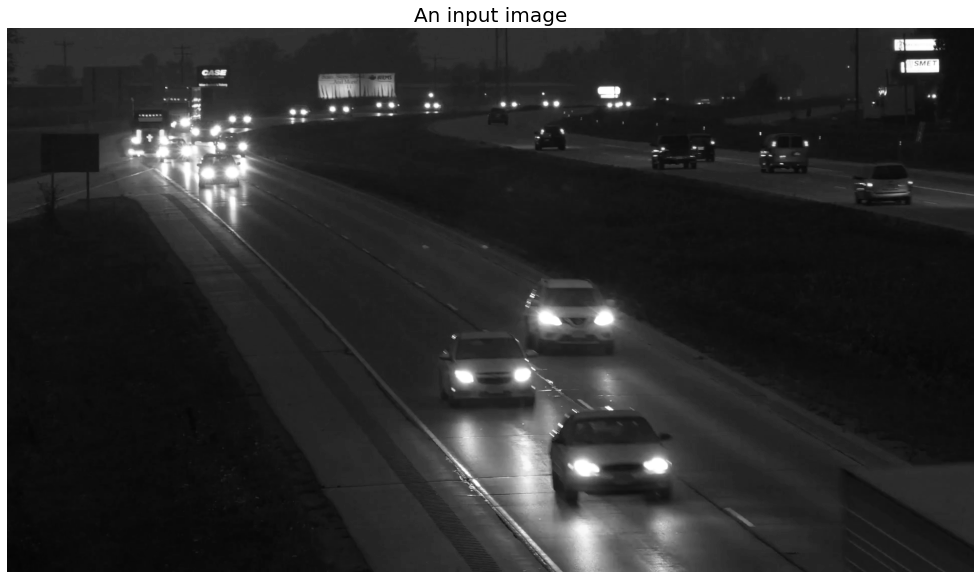

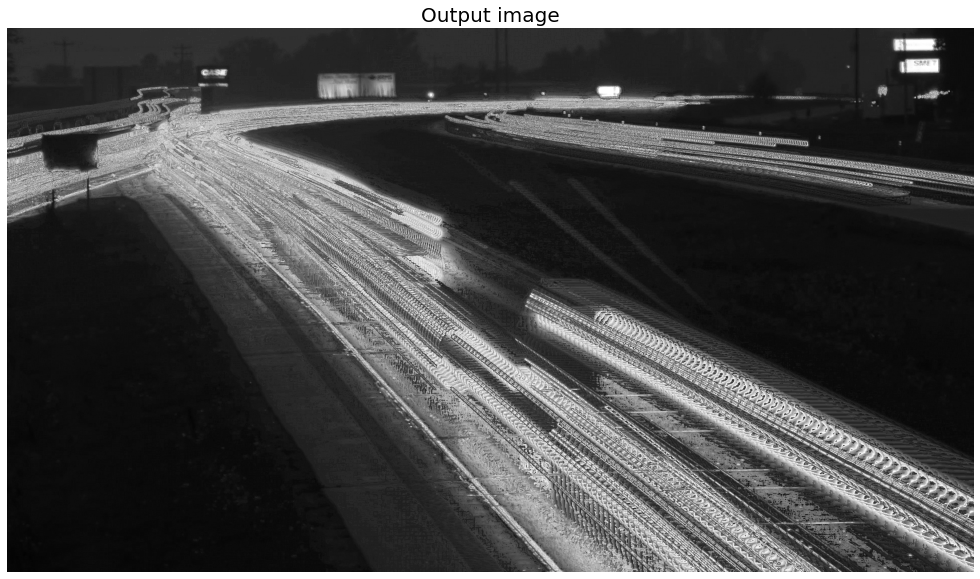

True

In [ ]:
# https://mahotas.readthedocs.io/en/latest/edf.html
from glob import glob
import cv2
import numpy as np
import matplotlib.pylab as plt
import mahotas as mh
print(mh.__version__)

# 1.
"""
  Prvo stvaramo skup fotografija izvlačenjem sivih frejmova iz videa
"""
def create_image_stack(vid_file, n = 200):
    
    vidcap = cv2.VideoCapture(vid_file)
    success,image = vidcap.read()
    i = 0
    success = True
    h, w = image.shape[:2]
    imstack = np.zeros((n, h, w))
    while success and i < n:
      imstack[i,...] = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
      success,image = vidcap.read()
      i += 1
    return imstack

image = create_image_stack('images/highway.mp4') #cloud.mp4
stack,h,w = image.shape
plt.figure(figsize=(20,10))
plt.gray()
plt.imshow(image[0,...].astype(np.uint8)), plt.axis('off')
plt.title('Ulazna fotografija', size=20)
plt.axis('off')
plt.show()

# 2. Koristimo funkciju sobel() iz mahatas biblioteke kao meru nivoa fokusiranosti piksela:
focus = np.array([mh.sobel(t, just_filter=True) for t in image])

# 3. Na svakom mestu piksela odabiramo najbolji presek (sa maksimalnim fokusom) i
# kreiramo konačnu sliku:
best = np.argmax(focus, 0)
image = image.reshape((stack,-1)) # image is now (stack, nr_pixels)
image = image.transpose() # image is now (nr_pixels, stack)
final = image[np.arange(len(image)), best.ravel()] # Select the right pixel at each location
final = final.reshape((h,w)) # reshape to get final result
plt.figure(figsize=(20,10))
plt.imshow(final.astype(np.uint8))
plt.axis('off'), plt.title('Izlazna fotografija', size=20)
plt.show()
cv2.imwrite('images/edf.png', final)

### Detekcija boja pomoću opencv-python biblioteke

Otkrivanje boja je postupak otkrivanja imena bilo koje boje. Za ljude je ovo izuzetno lak zadatak, ali za računare to nije jednostavno. Ljudske oči i mozak zajedno rade na prevođenju svetlosti u boju. Receptori svetlosti koji su prisutni u našim očima prenose signal u mozak. Naš mozak tada prepoznaje boju.

Boje se sastoje od 3 osnovne boje: crvena, zelena i plava. Na raačunarima se definiše vrednost boje u opsegu od 0 do 255.


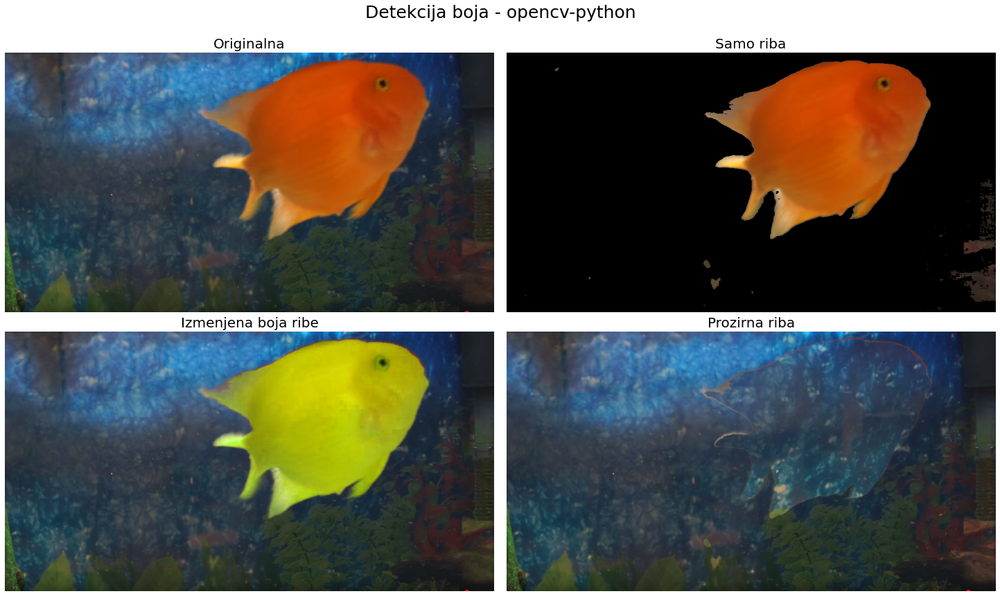

In [ ]:
#%matplotlib inline
import cv2
import numpy as np
import matplotlib.pylab as plt

# 1. Učitavamo ulaznu i pozadinsku fotografiju. 
#    Pretvorite ulaznu fotografiju iz RBG u HSV prostor boja:
bck = cv2.imread("images/fish_bg.png")
img = cv2.imread("images/fish.png")
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# 2. Kreiramo masku za ribu odabirom mogućeg raspona HSV boja koje riba može imati:
mask = cv2.inRange(hsv, (5, 75, 25), (25, 255, 255))

# 3. Isecamo narandžastu ribu koristeći masku:
imask = mask>0
orange = np.zeros_like(img, np.uint8)
orange[imask] = img[imask]

# 4. Menjamo boju narandžaste ribe u žutu promenom kanala "hue" (nijanse)
#    (dodajemo 20 na ceo kanal) i pretvaramo fotografiju nazad u RBG prostor

yellow = img.copy()
hsv[...,0] = hsv[...,0] + 20
yellow[imask] = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)[imask]
yellow = np.clip(yellow, 0, 255)

# 5. 
"""
  Na kraju, pravimo prozirnu sliku ribe, prvo izvlačenjem pozadine
  bez ulazne fotografije sa ribom, a zatim izvlačenja područja koje
  odgovara objektu (riba) u prvom planu iz fotografije u pozadini i
  dodajući ove dve fotografije:
"""
bckfish = cv2.bitwise_and(bck,bck, mask=imask.astype(np.uint8))
nofish = img.copy()
nofish = cv2.bitwise_and(nofish,nofish, mask=(np.bitwise_not(imask)).astype(np.uint8))
nofish = nofish + bckfish

plt.figure(figsize=(20,12))
plt.subplots_adjust(0,0,1,0.9,0.01,0.075)
plt.subplot(221), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.axis('off'), plt.title('Originalna', size=20)
plt.subplot(222), plt.imshow(cv2.cvtColor(orange, cv2.COLOR_BGR2RGB)), plt.axis('off'), plt.title('Samo riba', size=20)
plt.subplot(223), plt.imshow(cv2.cvtColor(yellow, cv2.COLOR_BGR2RGB)), plt.axis('off'), plt.title('Izmenjena boja ribe', size=20)
plt.subplot(224), plt.imshow(cv2.cvtColor(nofish, cv2.COLOR_BGR2RGB)), plt.axis('off'), plt.title('Prozirna riba', size=20)
plt.suptitle('Detekcija boja - opencv-python', size=25)
plt.show()

## Dodatni primeri

480 648 (480, 648, 3) (528, 829, 3)
True


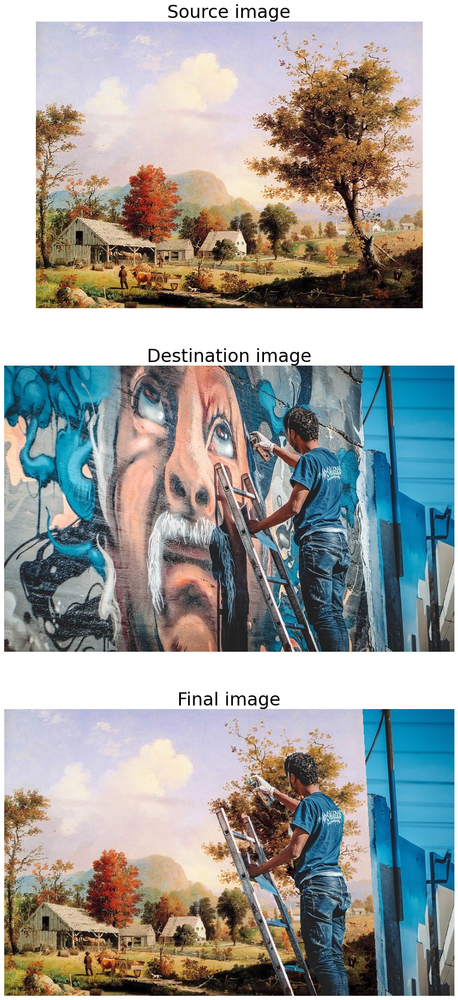

In [ ]:
from skimage.transform import ProjectiveTransform
from skimage.io import imread
import numpy as np
import matplotlib.pylab as plt

im_src = imread('images/painting.png')
im_dst = imread('images/graffiti.png')
im_mask = imread('images/graffiti_mask.png')
im_dst1 = np.copy(im_dst)
height, width, dim = im_src.shape
print(height, width, im_src.shape, im_dst.shape)

pt = ProjectiveTransform()
src = np.array([[   0.,    0.],
       [height-1,    0.],
       [height-1,  width-1],
       [   0.,  width-1]])
dst = np.array([[ 0., 0.],
       [im_dst.shape[0]-1, 0],
       [im_dst.shape[0]-1,  687],
       [ 0., 659]])
print(pt.estimate(src, dst))

im_dst_masked = im_dst & im_mask

x, y = np.mgrid[:im_dst.shape[0], :im_dst.shape[1]]
dst_indices = np.hstack((x.reshape(-1, 1), y.reshape(-1,1))) 
src_indices = np.round(pt.inverse(dst_indices), 0).astype(int)
valid_idx = np.where((src_indices[:,0] < height) & (src_indices[:,1] < width) & (src_indices[:,0] >= 0) & (src_indices[:,1] >= 0))
dst_indicies_valid = dst_indices[valid_idx]
src_indicies_valid = src_indices[valid_idx]
im_dst[dst_indicies_valid[:,0],dst_indicies_valid[:,1]] = im_src[src_indicies_valid[:,0],src_indicies_valid[:,1]]
im_dst &= (~im_mask) 
im_dst += im_dst_masked
plt.figure(figsize=(20,30))
plt.subplot(311), plt.imshow(im_src), plt.axis('off'), plt.title('Source image', size=30)
plt.subplot(312), plt.imshow(im_dst1), plt.axis('off'), plt.title('Destination image', size=30)
plt.subplot(313), plt.imshow(im_dst), plt.axis('off'), plt.title('Final image', size=30)
plt.show()

### Nelinearna transformacija

(220, 220, 3)


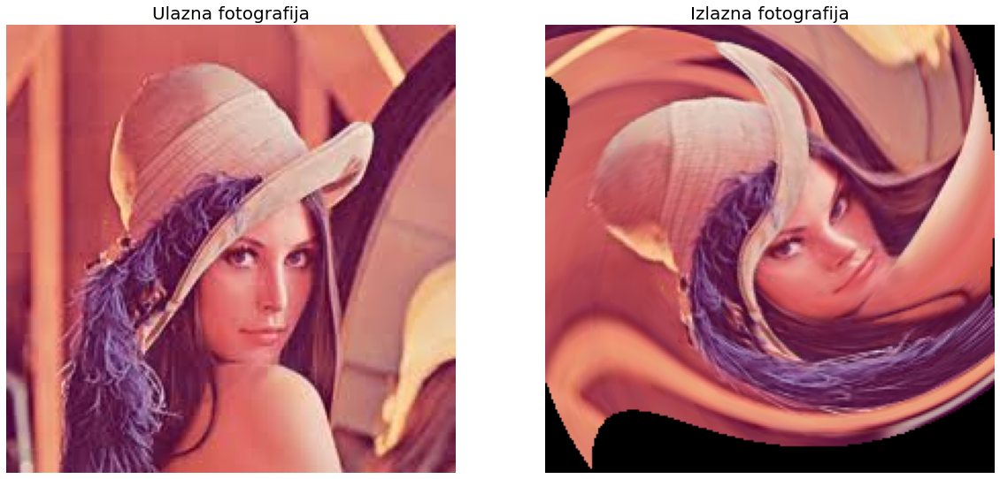

True

In [ ]:
from skimage.io import imread
from skimage.transform import warp, PolynomialTransform
import matplotlib.pylab as plt

# [ : , 0 ] je jednako izrazu [ prvi_red:poslednji_red , kolona_0 ]
def swirl(xy, x0, y0, R):
    r = np.sqrt((xy[:,1]-x0)**2 + (xy[:,0]-y0)**2)
    a = np.pi*r / R
    xy[:, 1], xy[:, 0] = (xy[:, 1]-x0)*np.cos(a) + (xy[:, 0]-y0)*np.sin(a) + x0, -(xy[:, 1]-x0)*np.sin(a) + (xy[:, 0]-y0)*np.cos(a) + y0
    return xy

im = imread('images/lena.png')
print(im.shape)
im1 = warp(im, swirl, map_args={'x0':100, 'y0':100, 'R':250})
plt.figure(figsize=(20,10))
plt.subplot(121), plt.imshow(im), plt.axis('off'), plt.title('Ulazna fotografija', size=20)
plt.subplot(122), plt.imshow(im1), plt.axis('off'), plt.title('Izlazna fotografija', size=20)
plt.show()

#print(im.shape, im1.shape)
t = PolynomialTransform()
x, y = np.mgrid[:im.shape[0], :im.shape[1]]
dst_indices = np.hstack((x.reshape(-1, 1), y.reshape(-1,1)))
dst_indices = dst_indices[np.random.choice(dst_indices.shape[0], 500),:]
src_indices = swirl(dst_indices, 100, 100, 250).astype(int)
t.estimate(dst_indices, src_indices, 8)
#print(src_indices)

#img_warped = warp(im1, t, order=3, mode='constant',cval=float('nan'))
#plt.figure(figsize=(10,10))
#plt.imshow(img_warped), plt.axis('off')
#plt.show()


### Elastična izobličenja

(220, 220, 3)


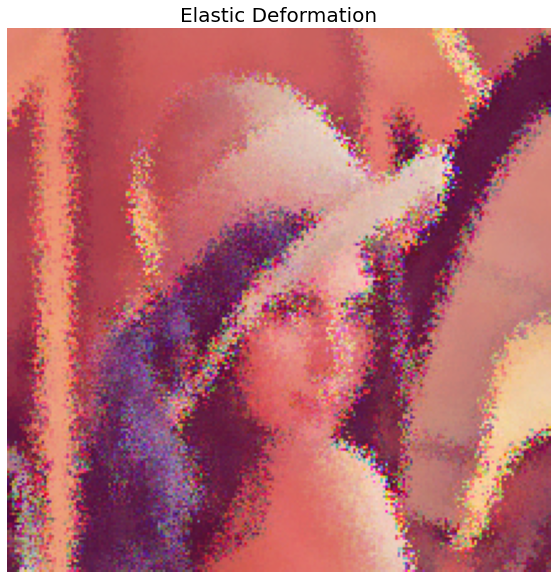

In [ ]:
# https://gist.github.com/erniejunior/601cdf56d2b424757de5
# http://cognitivemedium.com/assets/rmnist/Simard.pdf
import numpy as np
import matplotlib.pylab as plt
from skimage.color import rgb2gray
from scipy.ndimage import gaussian_filter, map_coordinates 

def elastic_transform(image, alpha, sigma, random_state=None):
    if random_state is None:
        random_state = np.random.RandomState(None)

    shape = image.shape
    dx = gaussian_filter((random_state.rand(*shape) * 2 - 1), sigma, mode="constant", cval=0) * alpha
    dy = gaussian_filter((random_state.rand(*shape) * 2 - 1), sigma, mode="constant", cval=0) * alpha
    dz = np.zeros_like(dx)
    #print(dx, dy, dz)
    x, y, z = np.meshgrid(np.arange(shape[0]), np.arange(shape[1]), np.arange(shape[2]))
    print (x.shape)
    indices = np.reshape(y+dy, (-1, 1)), np.reshape(x+dx, (-1, 1)), np.reshape(z, (-1, 1))

    distored_image = map_coordinates(image, indices, order=1, mode='reflect')
    return distored_image.reshape(image.shape)

img = plt.imread('images/lena.png')
img1 = elastic_transform(img, 8, 0.5)
plt.figure(figsize=(10,10))
plt.imshow(img1), plt.axis('off'), plt.title('Elastična Deformacija', size=20)
plt.show()

## Korisni linkovi

* [Python Numpy Tutorial](https://colab.research.google.com/github/cs231n/cs231n.github.io/blob/master/python-colab.ipynb)
* [Lectures on scientific computing with Python](https://github.com/jrjohansson/scientific-python-lectures)



## Reference


1.   [Python Image Processing Cookbook](https://www.amazon.com/Python-Image-Processing-Cookbook-processing-ebook/dp/B084ZN7Y5F), Sandipan Dey

2.   [Computer Vision – Image Transform](https://www.scilab.org/tutorials/computer-vision-%E2%80%93-image-transform)

3.   [Basic concepts of the homography explained with code](https://docs.opencv.org/master/d9/dab/tutorial_homography.html)

## TO DO

**Zadatak**

Potrebno je izvornu fotografiju astronauta na Mesecu ('images/man_moon.png') smestiti na platno odredišne fotografije ('images/shutterstock.png'). Opet, pružanjem četiri para tačaka za mapiranje
između izvora (tačke ugla) i odredišta (uglovi platna). 



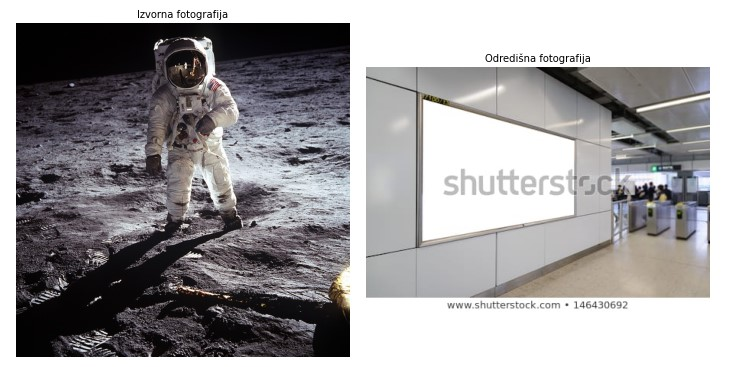

In [ ]:
# Izvorna i fotografija destinacije
from IPython.display import Image
Image('images/domaci/Primer1.jpg')

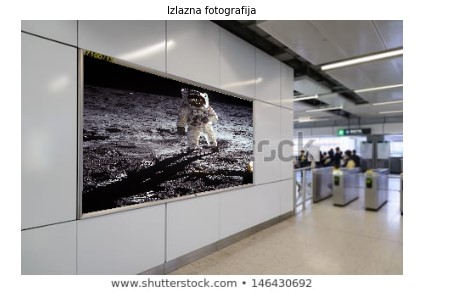

In [ ]:
# Rezultirajuća izlazna fotografija
from IPython.display import Image
Image('images/domaci/Primer1_resen.jpg')

In [ ]:
# TO DO ... - uraditi zadatak